## An example workflow for schism

This Notebook assumes locally stored datasets 

In [ ]:
#to use the full width of the browser window uncomment the code below and execute the cell
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [1]:
import pyPoseidon
import pyPoseidon.model as pmodel
import datetime
import pandas as pd
from pyPoseidon.utils import data,point

In [2]:
pyPoseidon.__version__

'0.4.0'

In [3]:
import holoviews as hv
import geoviews as gv
import geoviews.feature as gf
from cartopy import crs

In [4]:
from hvplot import xarray, pandas

### Define case

In [5]:
start_date = datetime.datetime.today() +  datetime.timedelta(days=-5)
start_date = start_date.strftime(format='%Y-%m-%d 0:0:0')
start_date

'2019-06-09 0:0:0'

In [6]:
#define in a dictionary the properties of the model..
dic={'solver':'schism',
     'grid_file': '../pyPoseidon/tests/data/hgrid.gr3',
     'config_file': '/Users/brey/SCHISM/test/param.in',
     'manning':.12,
     'windrot':0.00001,
     'tag':'iceland',
     'meteo':'https://nomads.ncep.noaa.gov:9090/dods/gfs_0p25_1hr/gfs{}/gfs_0p25_1hr_{}z'.format(start_date.strftime('%Y%m%d'),start_date.strftime('%H')),
     'start_date': start_date,
     'time_frame':'85H',
#     'engine':'cfgrib',
#     'dem': 'gebco',
#     'dpath' : '/Users/brey/DATA/GEBCO_2014_2D.nc',
     'epath':'/Users/brey/SCHISM/v5.6.1/src/schism.ex_VL', #solver executables
     'ncores': 4 , #number of cores
     'rpath':'/Users/brey/Downloads/EUR/SCHISM/schism/', #location of calc folder
     'conda_bin':'/Users/brey/miniconda3/bin/', #conda path
     'conda_env': 'pyPoseidon' # optional conda env for the solver
    }

#### Local operational ECMWF files

In [71]:
if 'time_frame' in dic.keys(): 
    end_date= pd.to_datetime(dic['start_date']) + pd.to_timedelta(dic['time_frame'])
    dic.update({'end_date':end_date.strftime(format='%Y-%m-%d %H:%M:%S')})

In [8]:
dic['end_date']

'2011-01-01 12:00:00'

In [9]:
# FOR FORECAST - SINGLE FILE
dr = [pd.to_datetime(dic['start_date'])]
dr

[Timestamp('2011-01-01 00:00:00')]

In [10]:
#FOR USING THE OPTIMUM METEO
dr = pd.date_range(dic['start_date'],dic['end_date'], freq='12H')
dr

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 12:00:00'], dtype='datetime64[ns]', freq='12H')

In [12]:
#creating a sequence of folder from which we read the meteo.

PATH='../pyPoseidon/tests/data/'#Path to meteo files
folders = [datetime.datetime.strftime(x, '%Y%m%d.%H') for x in dr]
meteo_files = [PATH + datetime.datetime.strftime(x, '%Y%m%d.%H')+'.uvp_72.grib' for x in dr]
meteo_files

['../pyPoseidon/tests/data/20110101.00.uvp_72.grib',
 '../pyPoseidon/tests/data/20110101.12.uvp_72.grib']

#### update dictionary

In [ ]:
dic.update({'mpaths':meteo_files, 'engine':'cfgrib', 'combine':True})

## Initialize

In [7]:
#initialize a model
b = pmodel.model(**dic)

### set it up

In [8]:
b.set(**dic) #set it up 

read grid file ../pyPoseidon/tests/data/hgrid.gr3
dem from grid file

extracting meteo from https://nomads.ncep.noaa.gov:9090/dods/gfs_0p25_1hr/gfs20190610/gfs_0p25_1hr_00z

meteo done



In [9]:
b.impl.params.loc['dt']

vals     400 
Name: dt, dtype: object

In [10]:
b.impl.params.loc['nspool'] = int(1 * 3600 / 400) # hours between output * secs per hour / dt in secs
b.impl.params.loc['nspool']

vals    9
Name: nspool, dtype: object

In [11]:
b.impl.params.loc['ihfskip'] = int(4 * 3600 / 400) # hours bundled together in output stack * secs per hour / dt in secs
b.impl.params.loc['ihfskip']

vals    36
Name: ihfskip, dtype: object

In [12]:
b.impl.params.loc['hotout_write'] = int(12 * 3600 / 400) # timesteps = hours between hotstart * secs per hour / dt in secs
b.impl.params.loc['hotout_write']

vals    108
Name: hotout_write, dtype: object

In [13]:
#Change param variables accordingly 
b.impl.params.loc['rnday'] = 3.5
b.impl.params.loc['hotout'] = 0 # save hotstart
b.impl.params.loc['ihot']=0 # no hotstart 

## Save to folder for execution 

In [14]:
#set the run by saving the files
b.output()

Keeping bathymetry from hgrid.gr3 ..

Manning file created..

Windrot_geo2proj file created..



In [15]:
# save model info for further use
b.save()

In [16]:
# save all matrices for further use
#b.pickle(path=path)

### execute

In [17]:
#execute
b.run()

application called MPI_Abort(comm=0x84000002, 0) - process 2

   2: ABORT:  no appropriate time exists for: sflux_air_1                                       time_now =    2455229.0000000000      first time available =    2458645.0000000000      last time available =    2458648.5416667461      got_bracket =  F got_suitable_bracket =  F                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

## Analysis of output 

In [84]:
otp = data(**dic)#,tag='eur')# optional tag for data selection ,sa_date='2010-2-1 5:0:0',se_date='2010-2-1 22:0:0') # optionally set range for tide gauge data acquisition 

Combining output



In [85]:
otp.impl.Dataset

<xarray.Dataset>
Dimensions:                  (nMaxSCHISM_hgrid_face_nodes: 4, nSCHISM_hgrid_edge: 3114, nSCHISM_hgrid_face: 1949, nSCHISM_hgrid_node: 1165, nSCHISM_vgrid_layers: 2, one: 1, sigma: 2, time: 72, two: 2)
Coordinates:
  * time                     (time) datetime64[ns] 2019-06-10T01:00:00 ... 2019-06-11T12:00:00
  * sigma                    (sigma) float64 -1.0 0.0
Dimensions without coordinates: nMaxSCHISM_hgrid_face_nodes, nSCHISM_hgrid_edge, nSCHISM_hgrid_face, nSCHISM_hgrid_node, nSCHISM_vgrid_layers, one, two
Data variables:
    wetdry_elem              (time, nSCHISM_hgrid_face) float64 0.0 0.0 ... 1.0
    zcor                     (time, nSCHISM_hgrid_node, nSCHISM_vgrid_layers) float32 -1836.0 ... -0.009680815
    elev                     (time, nSCHISM_hgrid_node) float32 0.0 ... -0.009680815
    wind_speed               (time, nSCHISM_hgrid_node, two) float32 -0.18864074 ... 1.3823822
    dahv                     (time, nSCHISM_hgrid_node, two) float32 0.0015748626

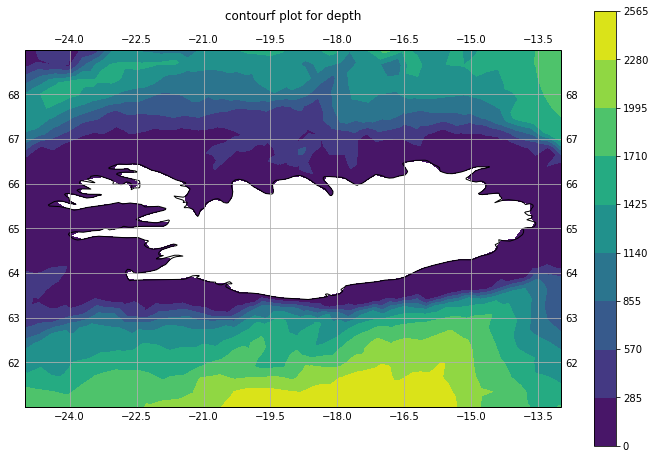

In [86]:
otp.impl.Dataset.splot.contourf('depth' )#,vmin=0, vmax=6452)

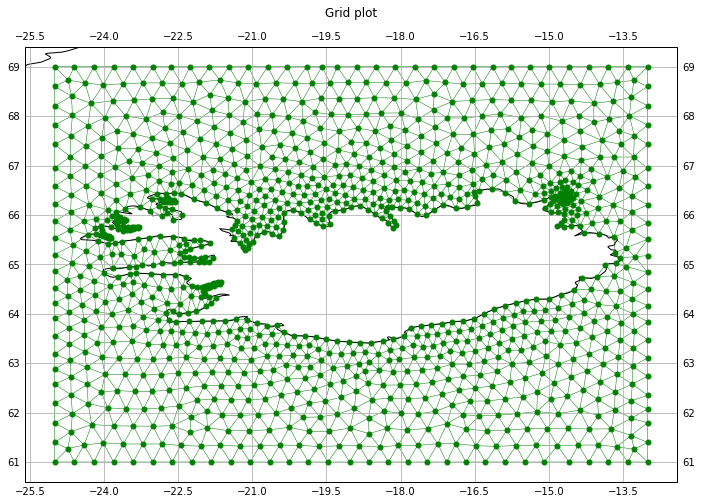

In [87]:
otp.impl.Dataset.splot.grid()

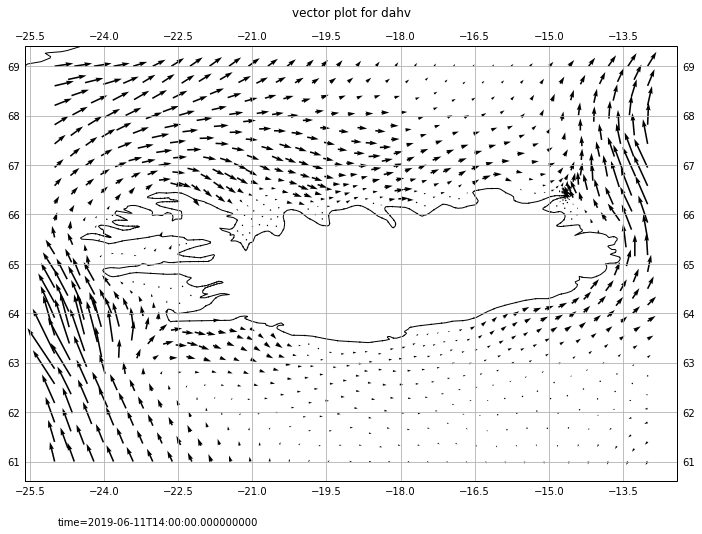

In [88]:
otp.impl.Dataset.splot.quiver('dahv',it=5,scale=0.5e-1)

### Visualize

In [89]:
otp.impl.Dataset.splot.frames('elev',title='SSH')#,vmin=-.5, vmax=.5, nv=20)

In [95]:
otp.impl.Dataset.splot.qframes('dahv',title='Vel',scale=.1)

## Observation points / Validation

In [96]:
otp.impl.obs.locations

,ID,Name,Group,Latency,Details,Last Date,Max. Time,Min. Time,lat,lon,Status
0,982,Iceland - Reykjavik,TD UNESCO,43m,Details,09 Apr 2018 10:58,09 Apr 2018 10:58,29 Apr 2011 19:11,64.15,-21.933,Active


In [97]:
# Get with index number
p = otp.impl.obs.iloc(0)
print (p.head())
print (p.tail())

                     Level m  Tide m  Level-Tide m
TimeUTC                                           
2019-06-10 01:01:00    3.108   3.156        -0.048
2019-06-10 01:03:00    3.097   3.140        -0.043
2019-06-10 01:05:00    3.076   3.124        -0.048
2019-06-10 01:07:00    3.067   3.107        -0.040
2019-06-10 01:09:00    3.066   3.090        -0.024
                     Level m  Tide m  Level-Tide m
TimeUTC                                           
2019-06-14 06:46:00    2.372   2.349         0.023
2019-06-14 06:48:00    2.344   2.328         0.016
2019-06-14 06:50:00    2.318   2.306         0.012
2019-06-14 06:52:00    2.304   2.284         0.020
2019-06-14 06:54:00    2.295   2.262         0.033


In [98]:
#... or get with Station Name  
p = otp.impl.obs.loc('Iceland - Reykjavik')
p.head()

,Level m,Tide m,Level-Tide m
TimeUTC,,,
2019-06-10 01:01:00,3.108,3.156,-0.048
2019-06-10 01:03:00,3.097,3.140,-0.043
2019-06-10 01:05:00,3.076,3.124,-0.048
2019-06-10 01:07:00,3.067,3.107,-0.040
2019-06-10 01:09:00,3.066,3.090,-0.024


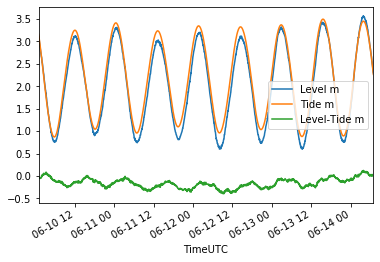

In [99]:
#plot
ax = p.plot()

### sample nearest point from simulation 

In [100]:
 plat,plon = otp.impl.obs.locations.loc[0,['lat','lon']]

In [101]:
ts = point(lon=plon,lat=plat,data=otp.impl.Dataset)
ts.stseries(var='elev')

In [103]:
ts.elev.head()

,elev
time,
2019-06-10 01:00:00,0.002579
2019-06-10 02:00:00,0.005030
2019-06-10 03:00:00,0.004468
2019-06-10 04:00:00,0.001244
2019-06-11 13:00:00,-0.015655


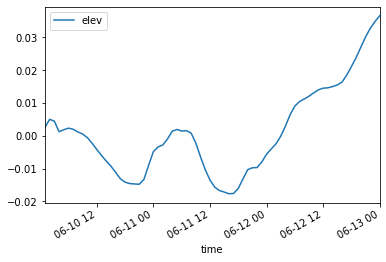

In [104]:
ts.elev.plot()

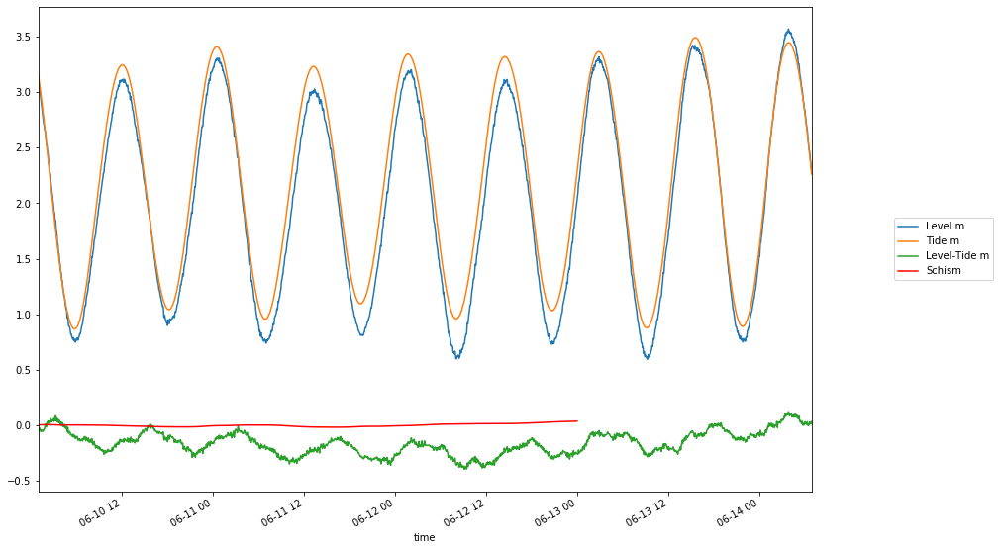

In [105]:
## Join the graphs
ax = p.plot(figsize=(14,10))
ts.elev.plot(ax=ax,color=['r'])
ax.legend(list(p.columns.values) + ['Schism'], loc='center left',bbox_to_anchor=(1.1, 0.5))